<a href="https://colab.research.google.com/github/AnanyaGodse/Image-Processing-and-Computer-Vision-I/blob/main/IPCV_Experiment_8_Frequency_Domain_Filters.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Name: Ananya Godse SAP ID: 60009220161 Batch: D1-1**

### **LAB 8 - Frequency Domain Filters**

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.fft import fft2, ifft2

In [ ]:
img = cv2.imread('Lenna.png')

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

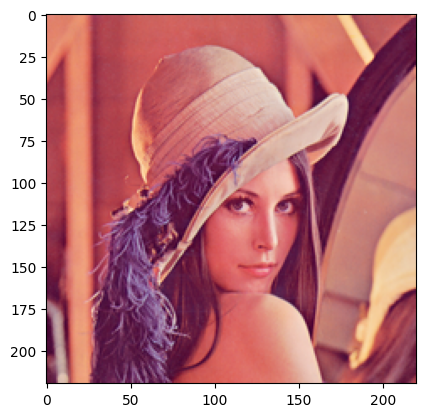

In [ ]:
plt.imshow(img)
plt.show()

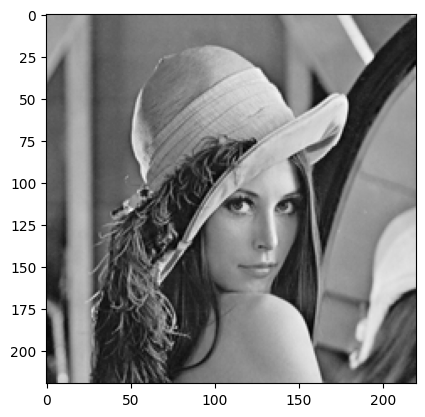

In [ ]:
gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

plt.imshow(gray_img, cmap='gray')
plt.show()

**Centering the image:**

In [ ]:
def centre(img):
  matrix = np.zeros_like(img)
  for i in range(img.shape[0]):
    for j in range(img.shape[1]):
      matrix[i, j] = np.power(-1, (i + j))

  result = img * matrix
  return result

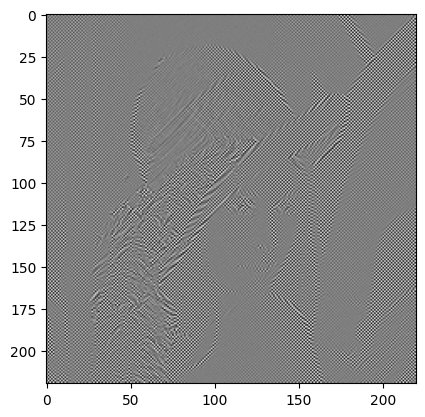

In [ ]:
centred_img = centre(gray_img)

plt.imshow(centred_img, cmap='gray')
plt.show()

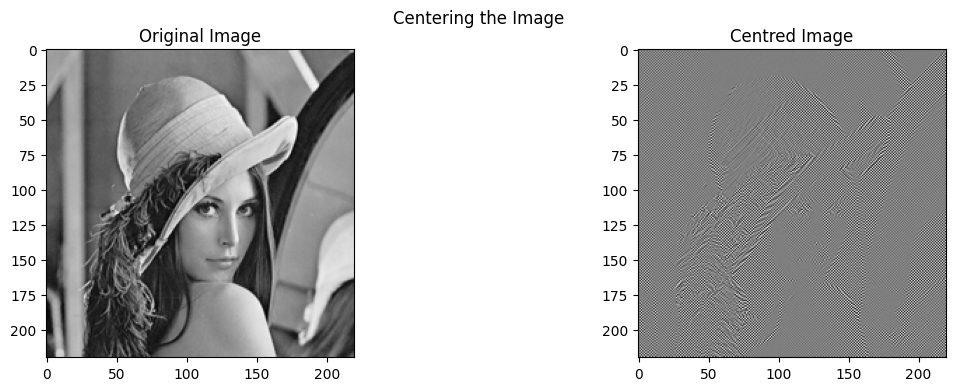

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Centering the Image')

plt.subplot(1, 2, 1)
plt.imshow(gray_img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(centred_img, cmap='gray')
plt.title('Centred Image')
plt.show()

**Fourier Transform:**


The Fourier Transform is a mathematical tool that converts an image from its spatial domain (where pixel values represent brightness and color) into the frequency domain. This transformation reveals the frequency components of the image.

**Applications:**

1. Frequency Analysis: Identifying patterns, textures, and edges in an image based on how quickly pixel values change.

2. Filtering: Separating and manipulating different frequency components to enhance features or remove noise (e.g., low-pass filters remove high-frequency noise).

3. Compression: Reducing the amount of data needed to represent an image by retaining only the essential frequency components (e.g., JPEG compression).

4. Image Reconstruction: Rebuilding the original image from its frequency components, enabling various transformations and effects.

In [ ]:
def fourier_transform(img):
  transformed_img = fft2(img)
  return transformed_img

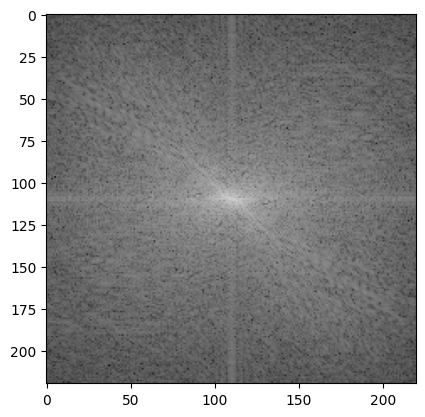

In [ ]:
transformed_img = fourier_transform(centred_img)

plt.imshow(np.log(np.abs(transformed_img) + 1), cmap='gray')
plt.show()

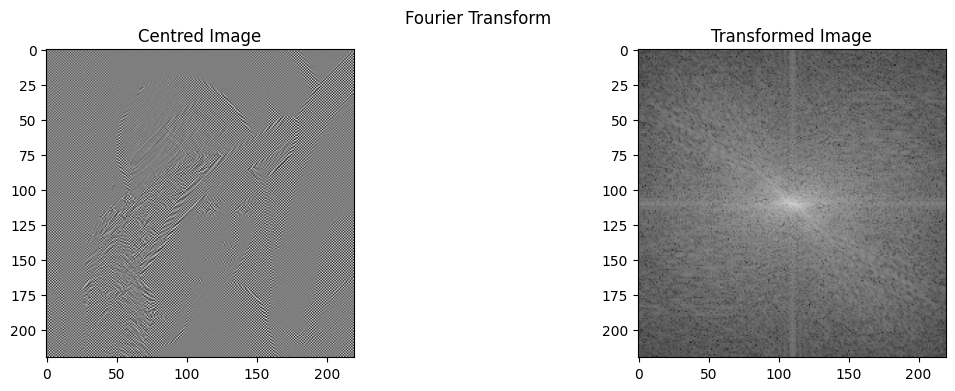

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Fourier Transform')

plt.subplot(1, 2, 1)
plt.imshow(centred_img, cmap='gray')
plt.title('Centred Image')

plt.subplot(1, 2, 2)
plt.imshow(np.log(np.abs(transformed_img) + 1), cmap='gray')
plt.title('Transformed Image')
plt.show()

**Calculate Euclidean Distance:**

In [ ]:
def calculate_euclidean_distance(img):
  distance_matrix = np.zeros_like(img)
  for i in range(img.shape[0]):
    for j in range(img.shape[1]):
      distance_matrix[i, j] = np.sqrt((np.power((i - (img.shape[0] / 2)), 2)) + (np.power((j - (img.shape[1] / 2)), 2)))
  return distance_matrix

**Ideal Low Pass Filter:**

A filter that allows frequencies below a certain cutoff to pass while blocking higher frequencies.

**Applications:** Image smoothing, noise reduction, and blurring effects.

In [ ]:
def ideal_low_pass_filter(img):
    distance_matrix = calculate_euclidean_distance(img)
    threshold = img.shape[0] / 4
    filter = np.where(distance_matrix < threshold, 1, 0)
    filtered_img = img * filter
    return filtered_img


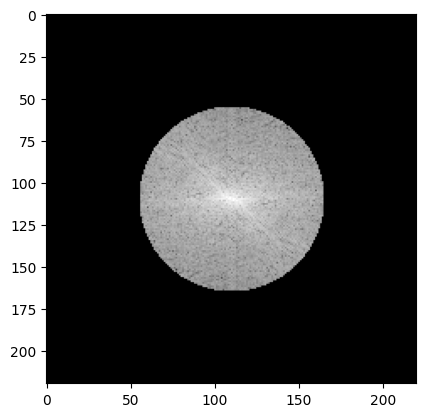

In [ ]:
ideal_low_pass_filtered_img = ideal_low_pass_filter(transformed_img)

plt.imshow(np.log(np.abs(ideal_low_pass_filtered_img) + 1), cmap='gray')
plt.show()

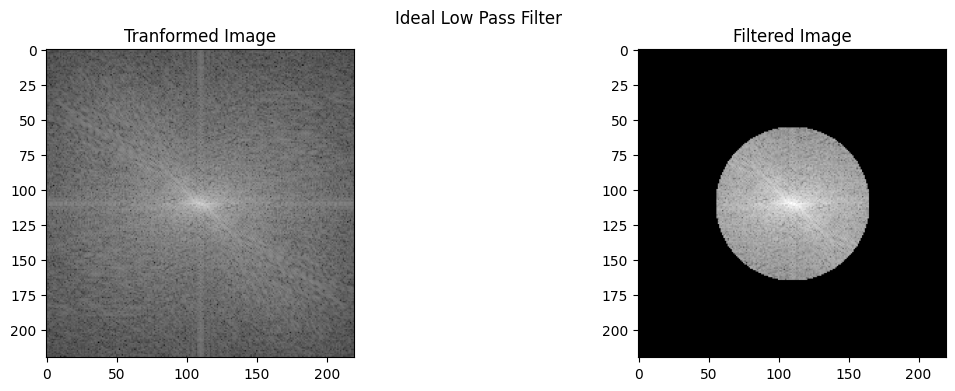

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Ideal Low Pass Filter')

plt.subplot(1, 2, 1)
plt.imshow(np.log(np.abs(transformed_img) + 1), cmap='gray')
plt.title('Tranformed Image')

plt.subplot(1, 2, 2)
plt.imshow(np.log(np.abs(ideal_low_pass_filtered_img) + 1), cmap='gray')
plt.title('Filtered Image')
plt.show()

**Ideal High Pass Filter:**

A filter that allows frequencies above a certain cutoff to pass while blocking lower frequencies.

**Applications:** Edge enhancement, sharpening, and detail extraction.

In [ ]:
def ideal_high_pass_filter(img):
  distance_matrix = calculate_euclidean_distance(img)
  threshold = img.shape[0] / 4
  filter = np.where(distance_matrix > threshold, 1, 0)
  filtered_img = img * filter
  return filtered_img

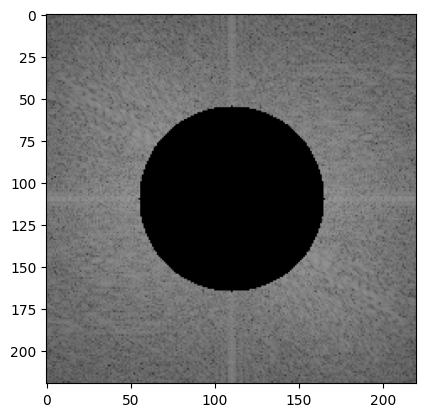

In [ ]:
ideal_high_pass_filtered_img = ideal_high_pass_filter(transformed_img)

plt.imshow(np.log(np.abs(ideal_high_pass_filtered_img) + 1), cmap='gray')
plt.show()

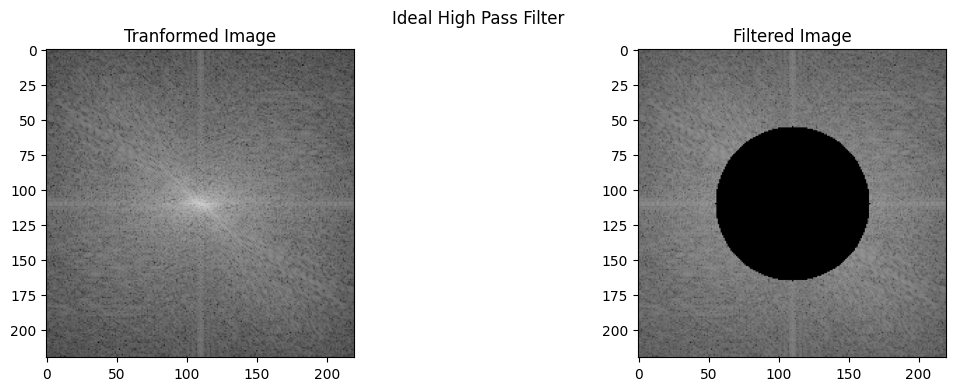

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Ideal High Pass Filter')

plt.subplot(1, 2, 1)
plt.imshow(np.log(np.abs(transformed_img) + 1), cmap='gray')
plt.title('Tranformed Image')

plt.subplot(1, 2, 2)
plt.imshow(np.log(np.abs(ideal_high_pass_filtered_img) + 1), cmap='gray')
plt.title('Filtered Image')
plt.show()

**Gaussian Low Pass Filter:**

A filter that allows low frequencies to pass with a Gaussian-shaped curve, providing a smooth transition.

**Applications:** Noise reduction, image blurring, and maintaining more natural appearance than ideal filters.

In [ ]:
def gaussian_low_pass_filter(img):
    distance_matrix = calculate_euclidean_distance(img)
    sigma = img.shape[0] / 4
    filter = np.exp(-distance_matrix**2 / (2 * sigma**2))
    filtered_img = img * filter
    return filtered_img

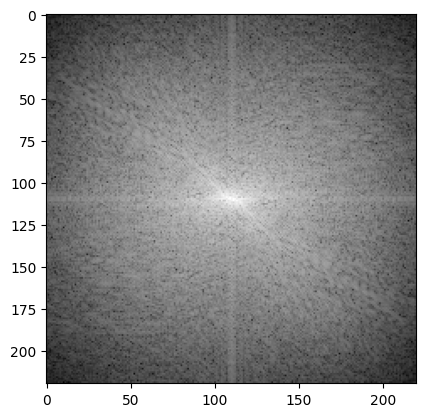

In [ ]:
gaussian_low_pass_filtered_img = gaussian_low_pass_filter(transformed_img)

plt.imshow(np.log(np.abs(gaussian_low_pass_filtered_img) + 1), cmap='gray')
plt.show()

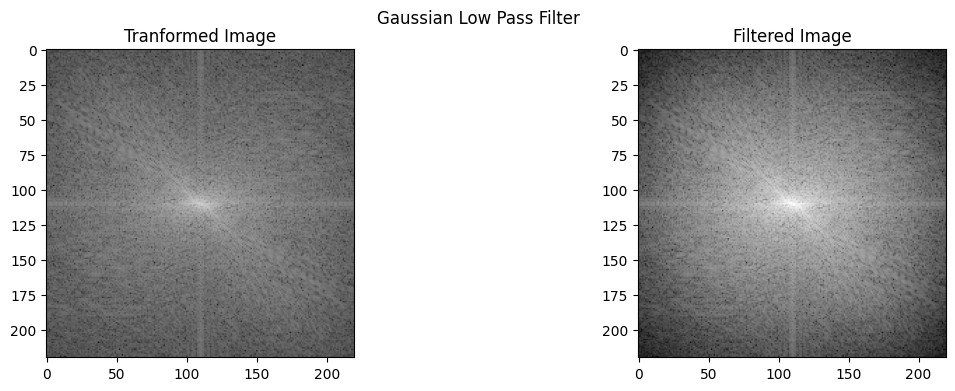

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Gaussian Low Pass Filter')

plt.subplot(1, 2, 1)
plt.imshow(np.log(np.abs(transformed_img) + 1), cmap='gray')
plt.title('Tranformed Image')

plt.subplot(1, 2, 2)
plt.imshow(np.log(np.abs(gaussian_low_pass_filtered_img) + 1), cmap='gray')
plt.title('Filtered Image')
plt.show()

**Gaussian High Pass Filter:**

A filter that allows high frequencies to pass with a Gaussian-shaped curve, providing a smooth transition.

**Applications:** Edge detection, detail enhancement, and reducing low-frequency noise while avoiding artifacts.

In [ ]:
def gaussian_high_pass_filter(img):
    distance_matrix = calculate_euclidean_distance(img)
    sigma = img.shape[0] / 4
    filter = 1 - np.exp(-distance_matrix**2 / (2 * sigma**2))
    filtered_img = img * filter
    return filtered_img

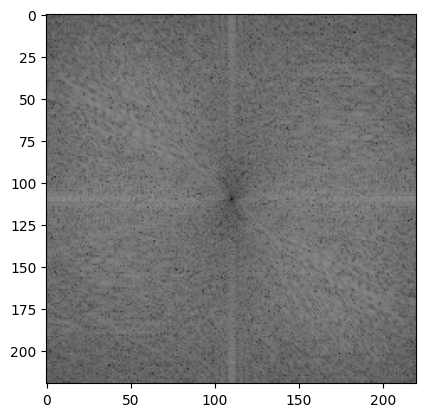

In [ ]:
gaussian_high_pass_filtered_img = gaussian_high_pass_filter(transformed_img)

plt.imshow(np.log(np.abs(gaussian_high_pass_filtered_img) + 1), cmap='gray')
plt.show()

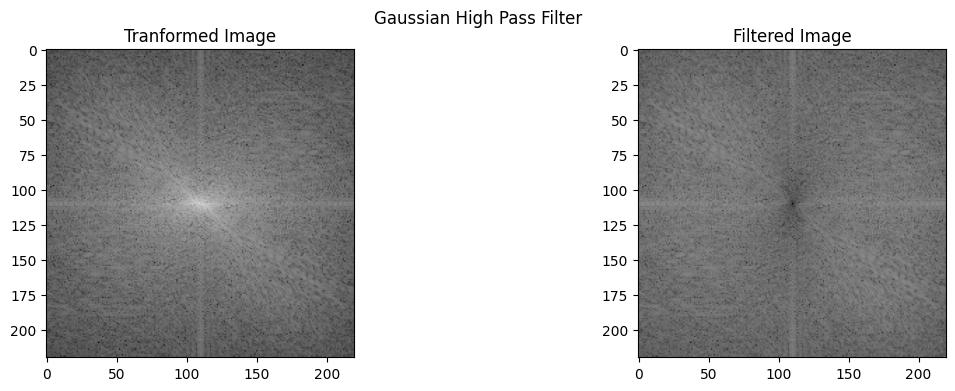

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Gaussian High Pass Filter')

plt.subplot(1, 2, 1)
plt.imshow(np.log(np.abs(transformed_img) + 1), cmap='gray')
plt.title('Tranformed Image')

plt.subplot(1, 2, 2)
plt.imshow(np.log(np.abs(gaussian_high_pass_filtered_img) + 1), cmap='gray')
plt.title('Filtered Image')
plt.show()

**Inverse Fourier Transform:**

The Inverse Fourier Transform is a mathematical technique that converts a signal or function from the frequency domain back to its original spatial (or time) domain. It reconstructs the original image or signal using its frequency components, effectively reversing the process of the Fourier Transform.

**Applications:**
1. Image Reconstruction: Allows the recovery of the original image from its frequency representation, enabling edits and modifications.

2. Filtering Operations: After applying filters in the frequency domain (like low-pass or high-pass filters), the Inverse Fourier Transform is used to convert the filtered image back to the spatial domain for viewing and analysis.

3. Image Compression: Used in processes like JPEG compression, where the image is transformed, compressed in the frequency domain, and then reconstructed for display.

4. Frequency Domain Modifications: After manipulating specific frequency components, the Inverse Fourier Transform helps visualize the effects of those changes in the original spatial form.

In [ ]:
def inverse_fourier_transform(img):
  transformed_img = ifft2(img)
  return transformed_img

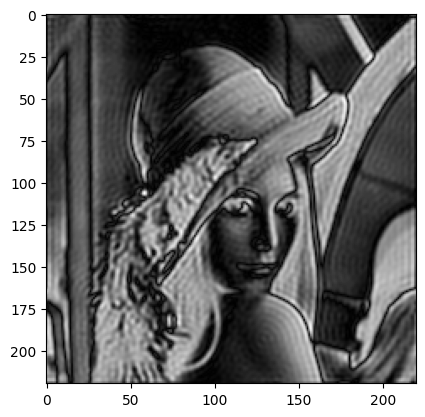

In [ ]:
inverse_transformed_img1 = inverse_fourier_transform(ideal_low_pass_filtered_img)

plt.imshow(np.abs(inverse_transformed_img1), cmap='gray')
plt.show()

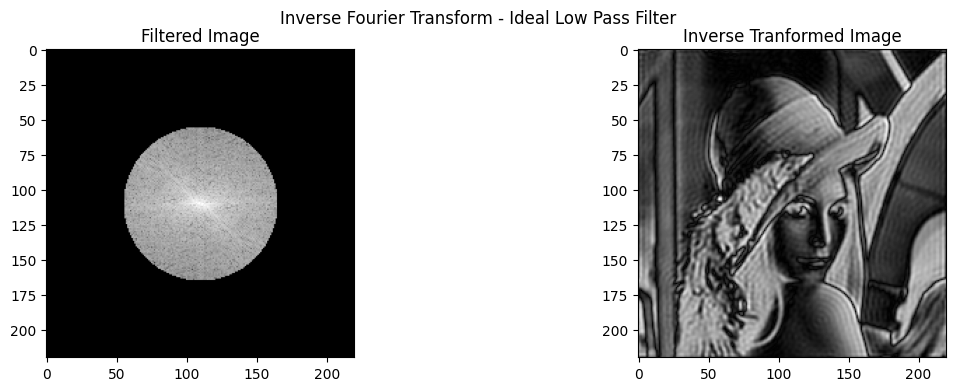

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Inverse Fourier Transform - Ideal Low Pass Filter')

plt.subplot(1, 2, 1)
plt.imshow(np.log(np.abs(ideal_low_pass_filtered_img) + 1), cmap='gray')
plt.title('Filtered Image')

plt.subplot(1, 2, 2)
plt.imshow(np.abs(inverse_transformed_img1), cmap='gray')
plt.title('Inverse Tranformed Image')
plt.show()

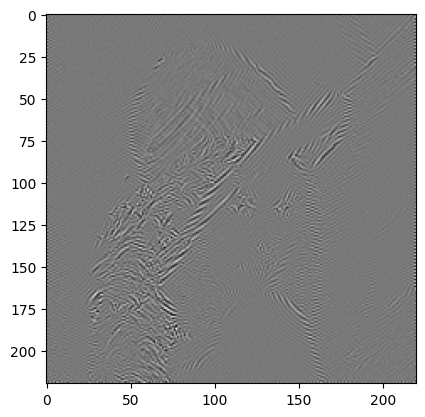

In [ ]:
inverse_transformed_img2 = inverse_fourier_transform(ideal_high_pass_filtered_img)

plt.imshow(np.abs(inverse_transformed_img2), cmap='gray')
plt.show()

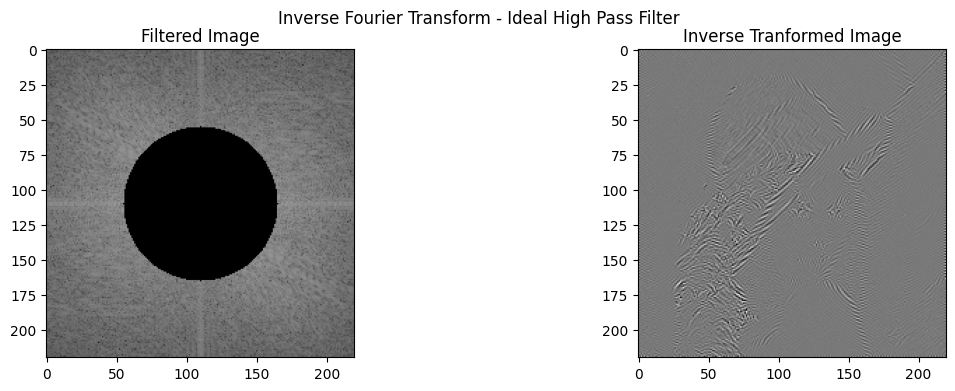

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Inverse Fourier Transform - Ideal High Pass Filter')

plt.subplot(1, 2, 1)
plt.imshow(np.log(np.abs(ideal_high_pass_filtered_img) + 1), cmap='gray')
plt.title('Filtered Image')

plt.subplot(1, 2, 2)
plt.imshow(np.abs(inverse_transformed_img2), cmap='gray')
plt.title('Inverse Tranformed Image')
plt.show()

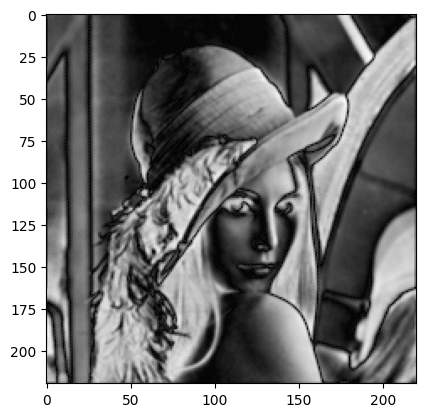

In [ ]:
inverse_transformed_img3 = inverse_fourier_transform(gaussian_low_pass_filtered_img)

plt.imshow(np.abs(inverse_transformed_img3), cmap='gray')
plt.show()

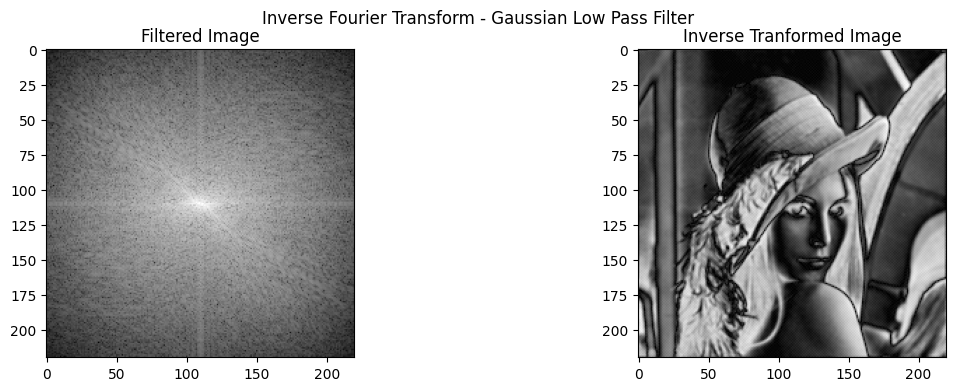

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Inverse Fourier Transform - Gaussian Low Pass Filter')

plt.subplot(1, 2, 1)
plt.imshow(np.log(np.abs(gaussian_low_pass_filtered_img) + 1), cmap='gray')
plt.title('Filtered Image')

plt.subplot(1, 2, 2)
plt.imshow(np.abs(inverse_transformed_img3), cmap='gray')
plt.title('Inverse Tranformed Image')
plt.show()

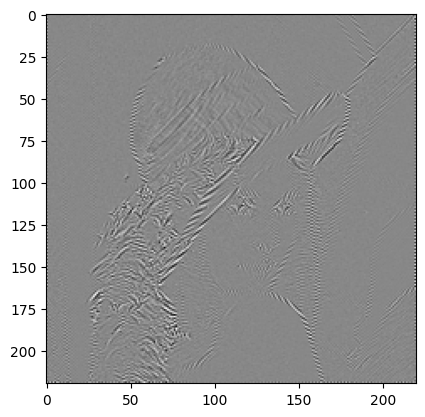

In [ ]:
inverse_transformed_img4 = inverse_fourier_transform(gaussian_high_pass_filtered_img)

plt.imshow(np.abs(inverse_transformed_img4), cmap='gray')
plt.show()

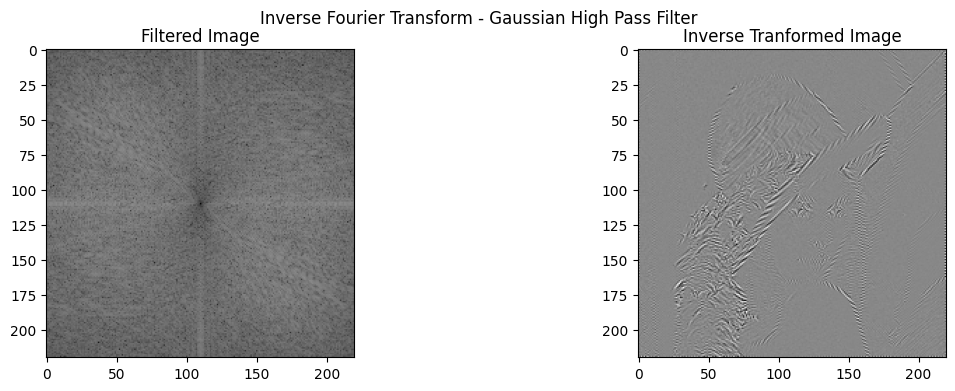

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Inverse Fourier Transform - Gaussian High Pass Filter')

plt.subplot(1, 2, 1)
plt.imshow(np.log(np.abs(gaussian_high_pass_filtered_img) + 1), cmap='gray')
plt.title('Filtered Image')

plt.subplot(1, 2, 2)
plt.imshow(np.abs(inverse_transformed_img4), cmap='gray')
plt.title('Inverse Tranformed Image')
plt.show()

**Centering the image:**

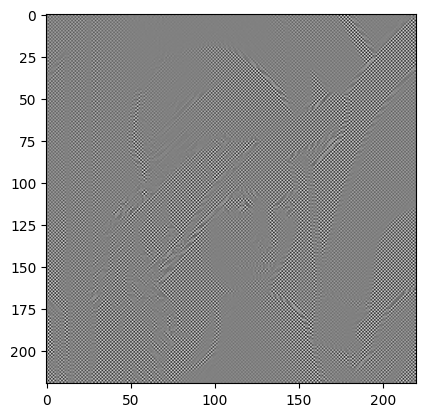

In [ ]:
centred_img1 = centre(np.abs(inverse_transformed_img1))

plt.imshow(centred_img1, cmap='gray')
plt.show()

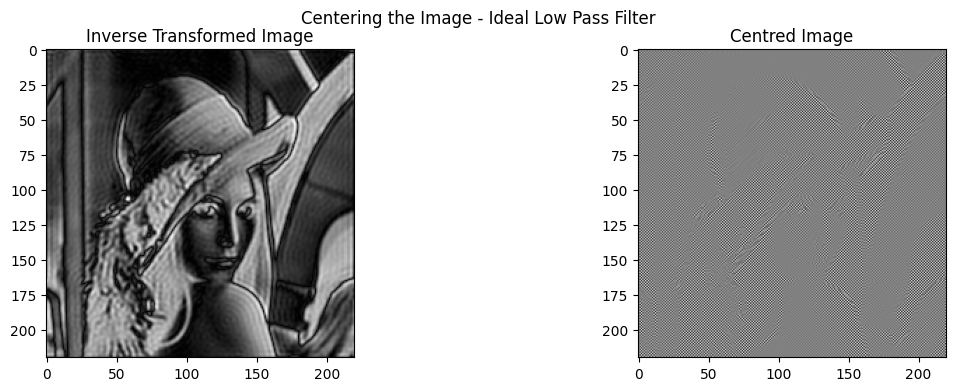

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Centering the Image - Ideal Low Pass Filter')

plt.subplot(1, 2, 1)
plt.imshow(np.abs(inverse_transformed_img1), cmap='gray')
plt.title('Inverse Transformed Image')

plt.subplot(1, 2, 2)
plt.imshow(centred_img1, cmap='gray')
plt.title('Centred Image')
plt.show()

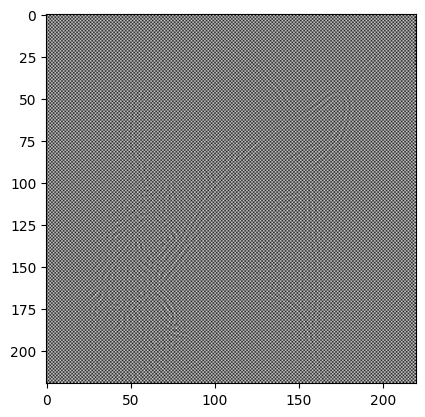

In [ ]:
centred_img2 = centre(np.abs(inverse_transformed_img2))

plt.imshow(centred_img2, cmap='gray')
plt.show()

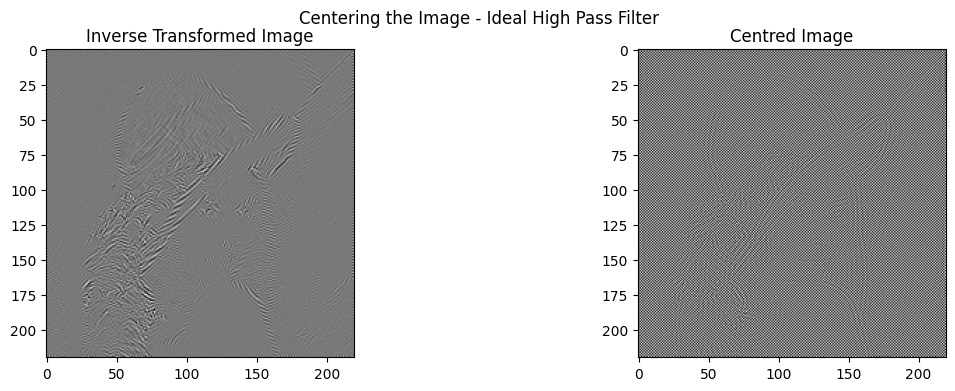

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Centering the Image - Ideal High Pass Filter')

plt.subplot(1, 2, 1)
plt.imshow(np.abs(inverse_transformed_img2), cmap='gray')
plt.title('Inverse Transformed Image')

plt.subplot(1, 2, 2)
plt.imshow(centred_img2, cmap='gray')
plt.title('Centred Image')
plt.show()

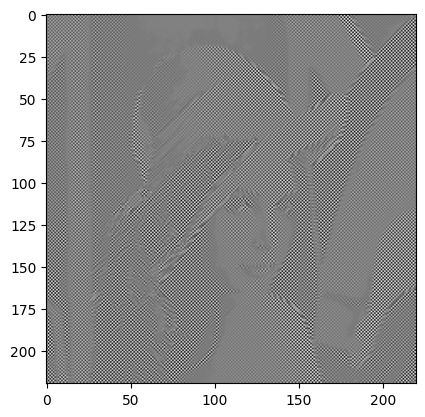

In [ ]:
centred_img3 = centre(np.abs(inverse_transformed_img3))

plt.imshow(centred_img3, cmap='gray')
plt.show()

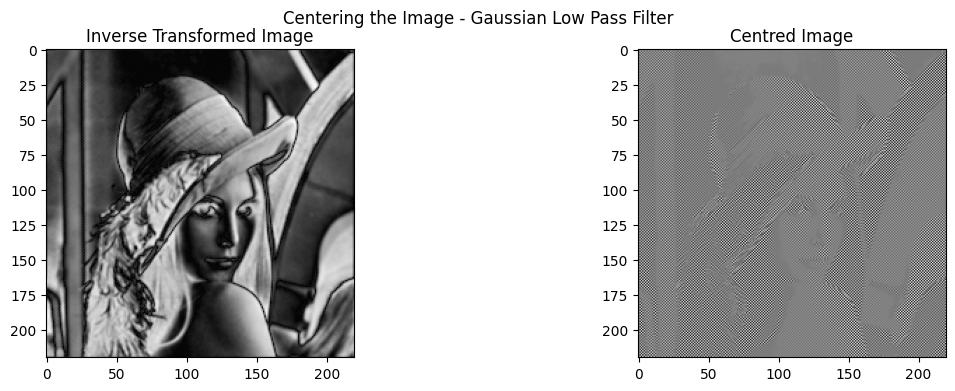

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Centering the Image - Gaussian Low Pass Filter')

plt.subplot(1, 2, 1)
plt.imshow(np.abs(inverse_transformed_img3), cmap='gray')
plt.title('Inverse Transformed Image')

plt.subplot(1, 2, 2)
plt.imshow(centred_img3, cmap='gray')
plt.title('Centred Image')
plt.show()

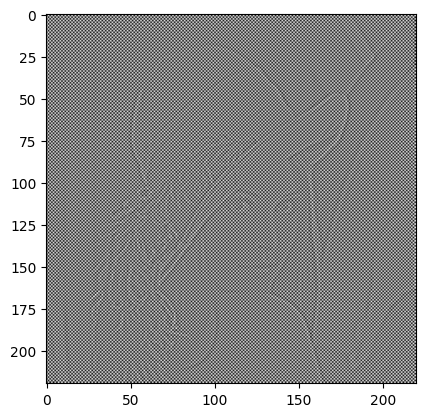

In [ ]:
centred_img4 = centre(np.abs(inverse_transformed_img4))

plt.imshow(centred_img4, cmap='gray')
plt.show()

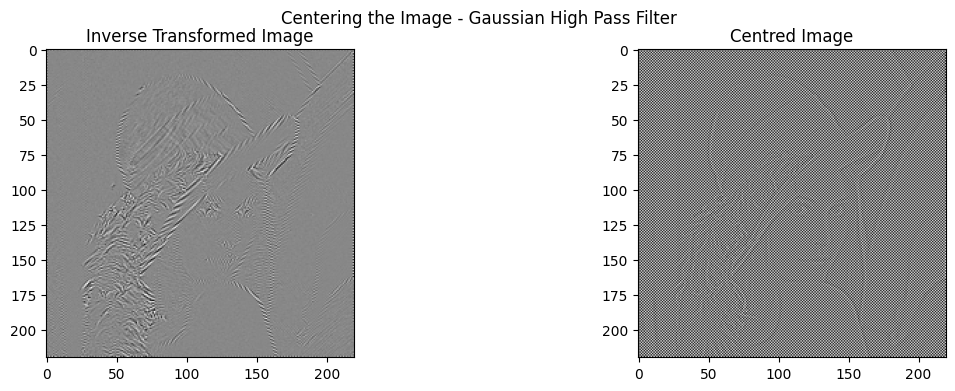

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Centering the Image - Gaussian High Pass Filter')

plt.subplot(1, 2, 1)
plt.imshow(np.abs(inverse_transformed_img4), cmap='gray')
plt.title('Inverse Transformed Image')

plt.subplot(1, 2, 2)
plt.imshow(centred_img4, cmap='gray')
plt.title('Centred Image')
plt.show()

**Final Results:**

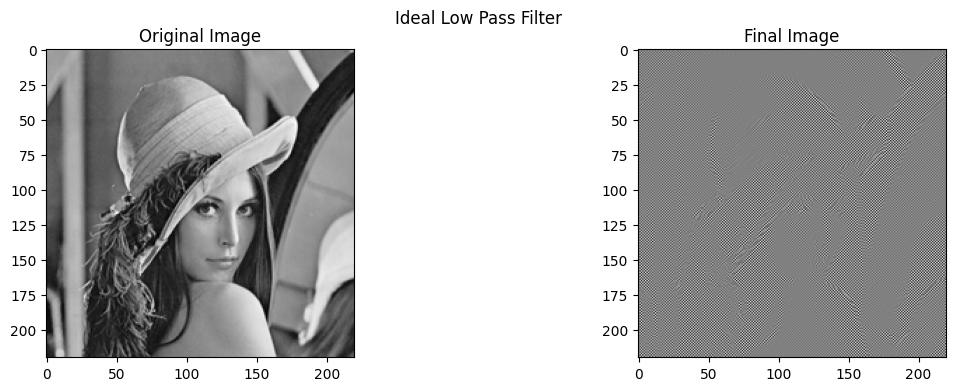

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Ideal Low Pass Filter')

plt.subplot(1, 2, 1)
plt.imshow(gray_img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(centred_img1, cmap='gray')
plt.title('Final Image')
plt.show()

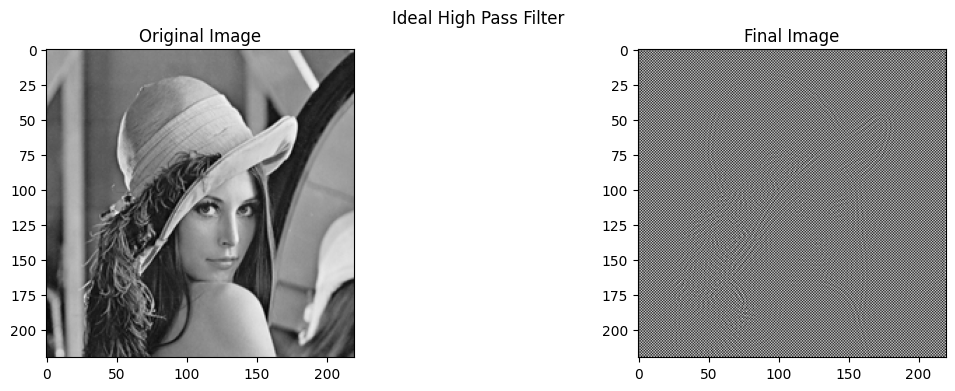

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Ideal High Pass Filter')

plt.subplot(1, 2, 1)
plt.imshow(gray_img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(centred_img2, cmap='gray')
plt.title('Final Image')
plt.show()

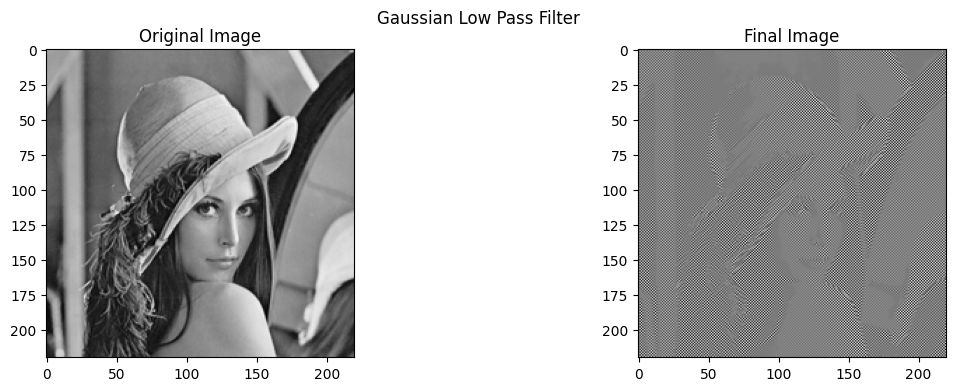

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Gaussian Low Pass Filter')

plt.subplot(1, 2, 1)
plt.imshow(gray_img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(centred_img3, cmap='gray')
plt.title('Final Image')
plt.show()

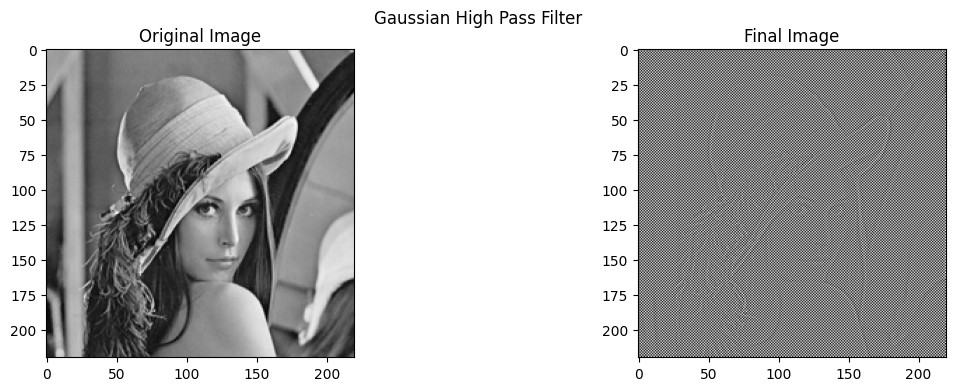

In [ ]:
plt.figure(figsize=(14, 4))
plt.suptitle('Gaussian High Pass Filter')

plt.subplot(1, 2, 1)
plt.imshow(gray_img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(centred_img4, cmap='gray')
plt.title('Final Image')
plt.show()

**Conclusion:** We successfully converted a gray-scale image from its spatial domain to its frequency domain using Fourier Transform and applied Ideal Low Pass, Ideal High Pass, Gaussian Low Pass & Gaussian High Pass Filters on it. We converted it back to its spatial domain using the Inverse Fourier Transformation. We also studied the applications of these transforms and filters.